In [1]:
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import random
import tqdm
import h5py
from sklearn.model_selection import train_test_split
import corner
from sklearn.datasets import make_circles
from sklearn.datasets import make_moons
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.model_selection import GridSearchCV

plt.rc('text', usetex=True)  # Abilita l'uso di LaTeX in tutte le stringhe di testo
plt.rc('font', family='serif')

%matplotlib inline
%config InlineBackend.figure_format='retina'

In [2]:
with h5py.File('sample_2e7_design_precessing_higherordermodes_3detectors.h5', 'r') as file:
    
    keys = list(file.keys())
    print(keys)
    
    data = {}
    for key in keys:
        data[key] = file[key][:]

['chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'det', 'iota', 'mtot', 'psi', 'q', 'ra', 'snr', 'z']


In [3]:
#take less data to start coding
data_batch = {}

for key, value in data.items():
    data_batch[key] = value[:100000]

In [4]:
for key in keys:
    print(len(data[key]), len(data_batch[key]))

20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000
20000000 100000


In [5]:
labels = data_batch['det'].copy()
snr = data_batch['snr'].copy()

par_keys = ['mtot', 'q', 'chi1x', 'chi1y', 'chi1z', 'chi2x', 'chi2y', 'chi2z', 'dec', 'ra', 'iota', 'psi' , 'z']
par = np.column_stack([data_batch[key] for key in par_keys])

labels_test = data['det'][100000:].copy()
snr_test = data_batch['snr'][100000:].copy()

In [6]:
# divide the data in train, val, test
par_train, par_val, lab_train, lab_val = train_test_split(par, labels, test_size=0.3, random_state=7)
print(len(par_train), len(par_val))

70000 30000


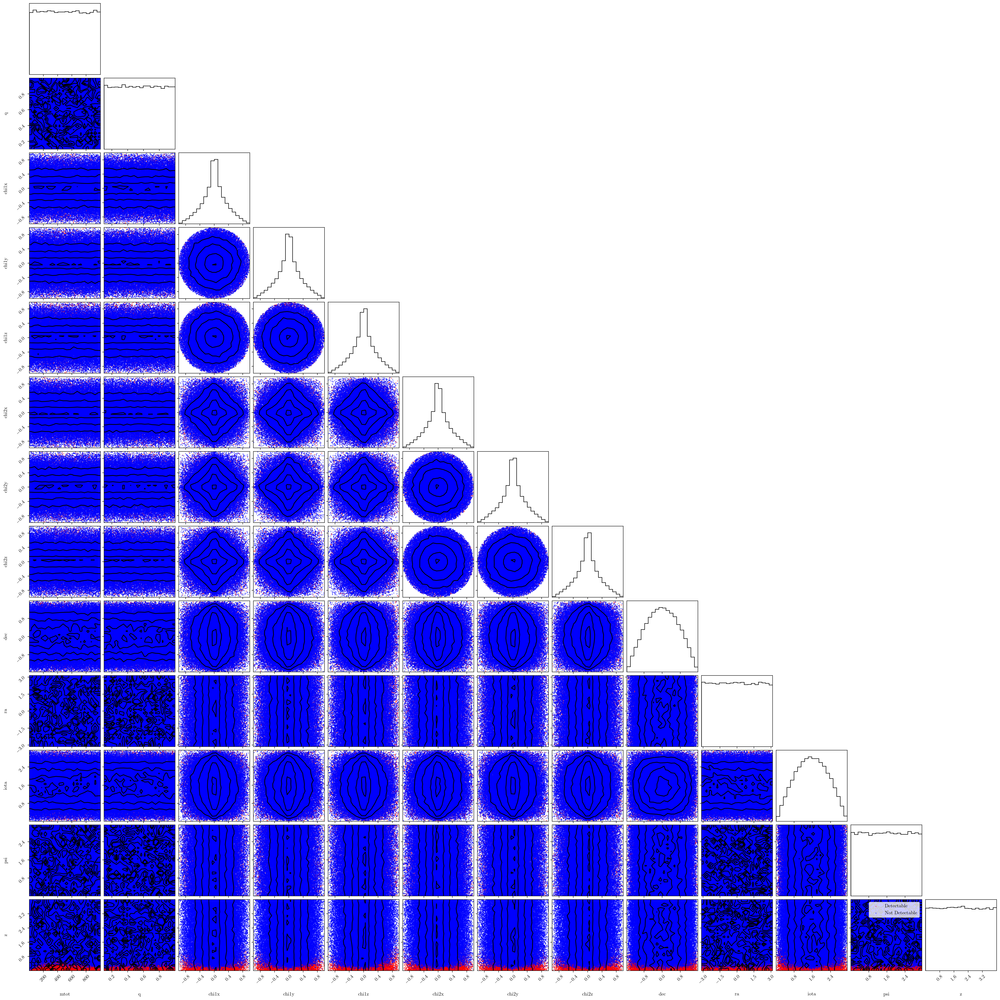

In [52]:
figure = corner.corner(par, labels=par_keys, plot_datapoints=False)

axes = np.array(figure.axes).reshape(len(par_keys), len(par_keys))

for i in range(len(par_keys)):
    for j in range(i):
        ax = axes[i, j]
        ax.scatter(par[labels == 1, j], par[labels == 1, i], color="red", s=1, label="Detectable", alpha=0.5)
        ax.scatter(par[labels == 0, j], par[labels == 0, i], color="blue", s=1, label="Not Detectable", alpha=0.5)
ax.legend()
plt.show()

in the last row we can clearly see that we have a huge amount of detectable sources at low z

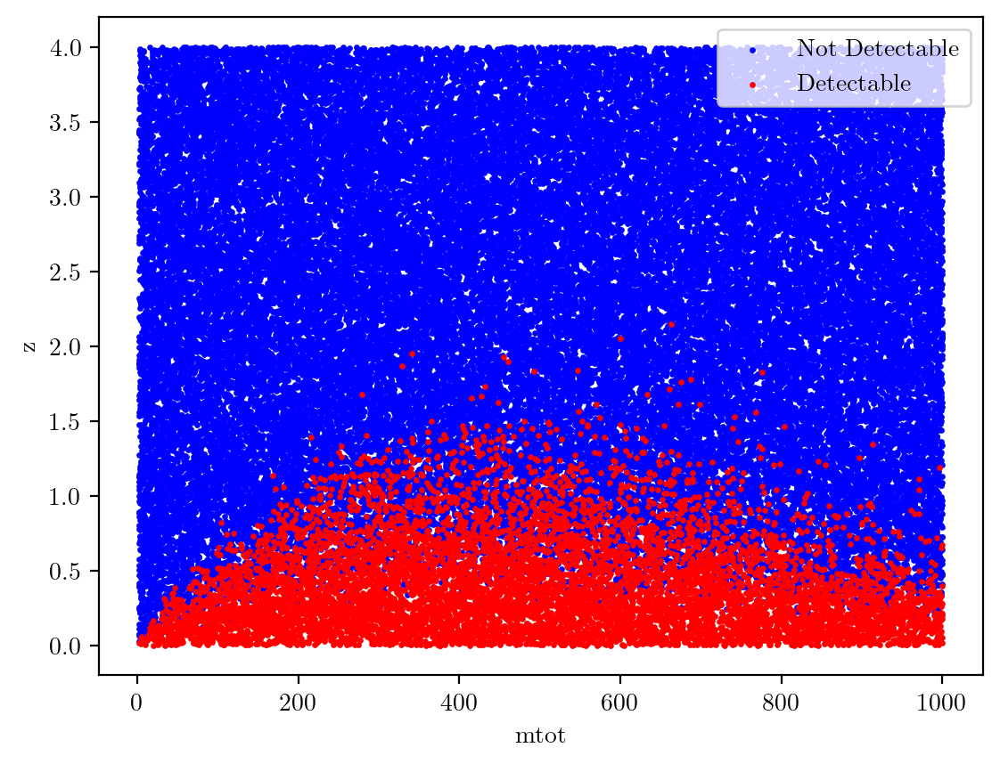

In [7]:
plt.scatter(par_train[lab_train==0,0], par_train[lab_train==0,-1], color = 'blue', label='Not Detectable', s=2)
plt.scatter(par_train[lab_train==1,0], par_train[lab_train==1,-1], color = 'red', label='Detectable', s=2)
plt.xlabel('mtot')
plt.ylabel('z')
plt.legend()
plt.show()

## Support Vector Machine with Kernel Methods (Radial Basis Function) with just these 2 features (M$_{tot}$ & z)

In [8]:
def plot_predictions(clf, axes):
    x0s = np.linspace(axes[0], axes[1], 100)
    x1s = np.linspace(axes[2], axes[3], 100)
    x0, x1 = np.meshgrid(x0s, x1s)
    X = np.c_[x0.ravel(), x1.ravel()]
    
    y_pred = clf.predict(X).reshape(x0.shape)
    y_decision = clf.decision_function(X).reshape(x0.shape)
    
    #prediction regions
    plt.contourf(x0, x1, y_pred, cmap=plt.cm.RdYlBu, alpha=0.3)
    #dec boundaries
    plt.contour(x0, x1, y_decision, colors='black', levels=[0], linewidths=2)

    
def plot_dataset(X, y, axes):
    plt.scatter(X[:, 0][y == 0], X[:, 1][y == 0], s=10, color='yellow', label='Class 0', alpha=0.8)
    plt.scatter(X[:, 0][y == 1], X[:, 1][y == 1], s=10, color='orange', label='Class 1', alpha=0.8)
    plt.axis(axes)
    plt.grid(True, which='both')
    plt.xlabel(r"$x_1$", fontsize=20)
    plt.ylabel(r"$x_2$", fontsize=20, rotation=0)
    plt.legend()

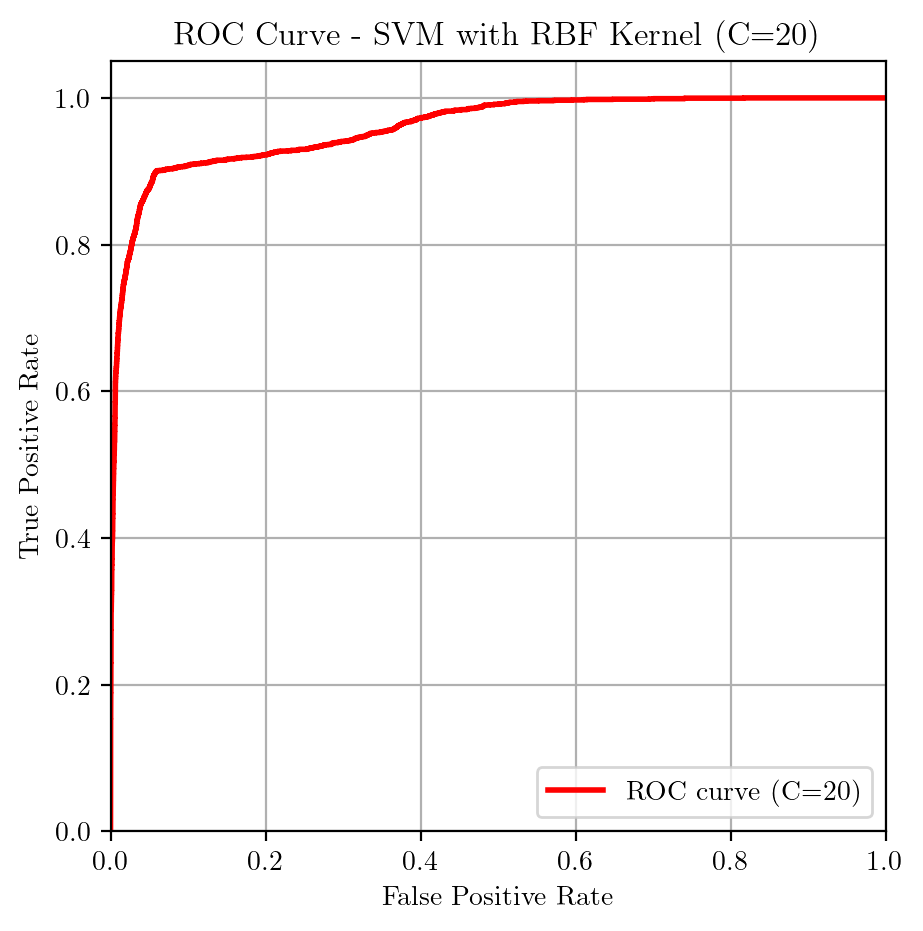

Accuracy with C=20: 0.9486


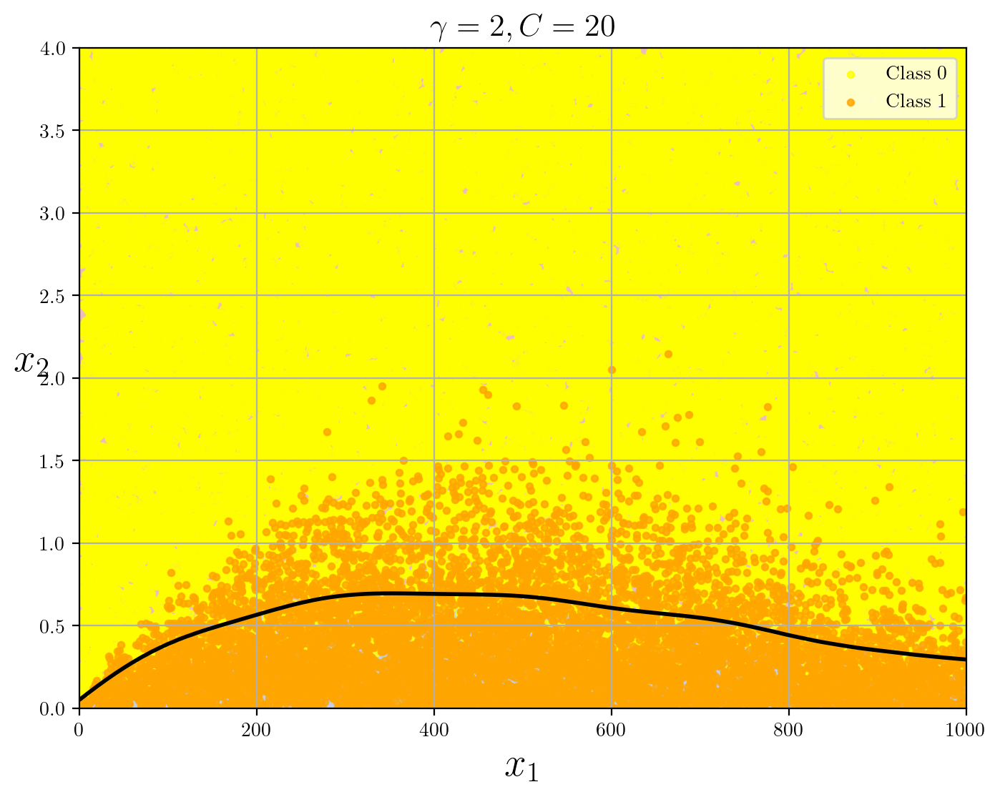

In [12]:
gamma_C20 = 2
C_C20 = 20
hyperparams_C20 = (gamma_C20, C_C20)

rbf_kernel_svm_clf_C20 = Pipeline([
    ("scaler", StandardScaler()),
    ("svm_clf", SVC(kernel="rbf", gamma=gamma_C20, C=C_C20, probability=True))
])

rbf_kernel_svm_clf_C20.fit(X, y)

y_prob_C20 = rbf_kernel_svm_clf_C20.predict_proba(X_val)[:, 1]
y_pred_C20 = rbf_kernel_svm_clf_C20.predict(X_val)

fpr_C20, tpr_C20, _C20 = roc_curve(lab_val, y_prob_C20)
roc_auc_C20 = auc(fpr_C20, tpr_C20)

plt.figure(figsize=(5, 5))
plt.plot(fpr_C20, tpr_C20, color='red', lw=2, label=f'ROC curve (C=20)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM with RBF Kernel (C=20)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

accuracy_C20 = accuracy_score(lab_val, y_pred_C20)
print(f'Accuracy with C=20: {accuracy_C20:.4f}')

plt.figure(figsize=(8, 6))
plot_predictions(rbf_kernel_svm_clf_C20, [0, 1000, 0, 4])
plot_dataset(X, y, [0, 1000, 0, 4])

gamma_C20, C_C20 = hyperparams_C20
plt.title(r"$\gamma = {}, C = {}$".format(gamma_C20, C_C20), fontsize=16)

plt.show()


#### Cross Validation to search for optimal gamma and C

Best parameters: {'svm_clf__C': 50, 'svm_clf__gamma': 10}


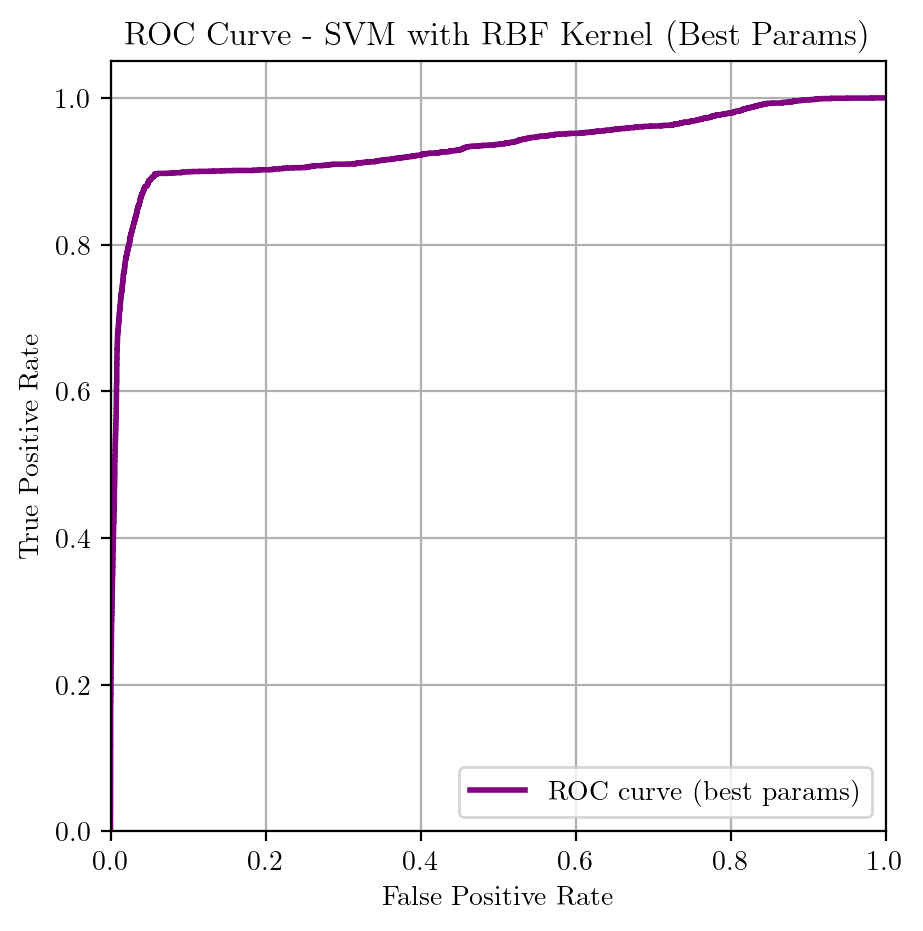

Accuracy with best parameters: 0.9513


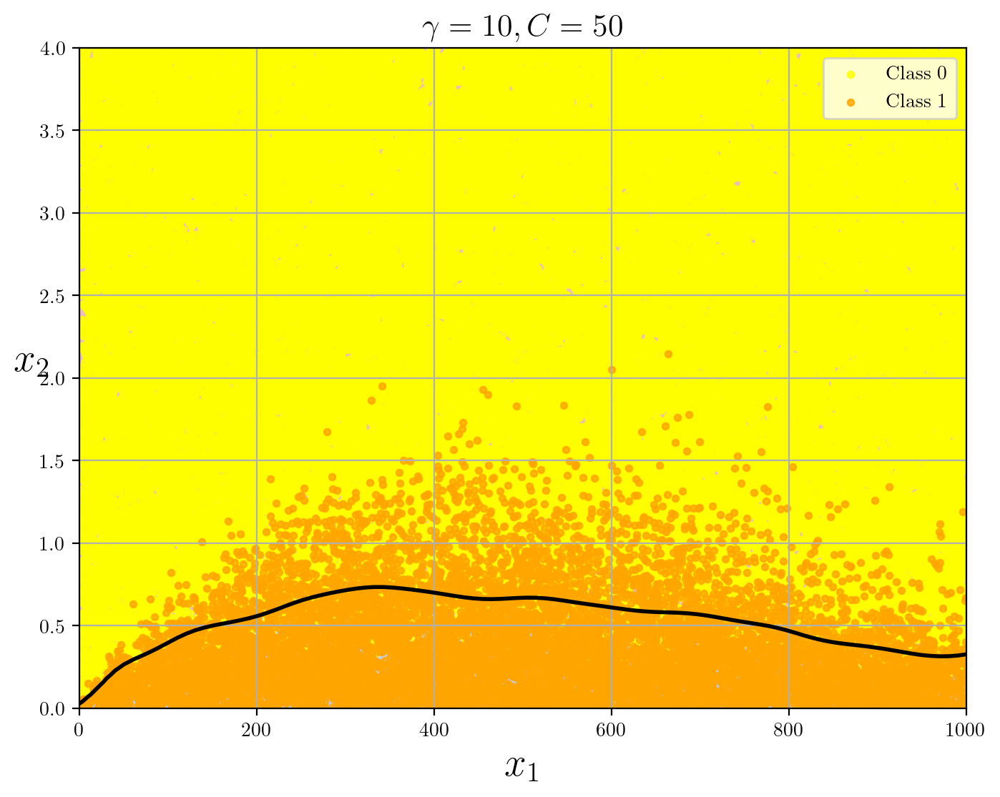

In [9]:
X_val =  np.column_stack([par_val[:,0], par_val[:,-1]]) 
X = np.column_stack([par_train[:,0], par_train[:,-1]])
y = lab_train

param_grid = {
    'svm_clf__C': [1, 20, 50],
    'svm_clf__gamma': [0.1, 2, 10]
}

rbf_kernel_svm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("svm_clf", SVC(kernel="rbf", probability=True))
])

grid_search = GridSearchCV(rbf_kernel_svm_clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X, y)

best_params = grid_search.best_params_
print(f'Best parameters: {best_params}')

# Use best model to predict on validation set
best_svm_clf = grid_search.best_estimator_
y_prob_best = best_svm_clf.predict_proba(X_val)[:, 1]
y_pred_best = best_svm_clf.predict(X_val)

fpr_best, tpr_best, _ = roc_curve(lab_val, y_prob_best)

plt.figure(figsize=(5, 5))
plt.plot(fpr_best, tpr_best, color='purple', lw=2, label='ROC curve (best params)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM with RBF Kernel (Best Params)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

accuracy_best = accuracy_score(lab_val, y_pred_best)
print(f'Accuracy with best parameters: {accuracy_best:.4f}')

plt.figure(figsize=(8, 6))
plot_predictions(best_svm_clf, [0, 1000, 0, 4])
plot_dataset(X, y, [0, 1000, 0, 4])

plt.title(r"$\gamma = {}, C = {}$".format(best_params['svm_clf__gamma'], best_params['svm_clf__C']), fontsize=16)

plt.show()


So the best model according to the cross val is with C=20 and $\gamma$=0.1 . Let's use this model, fitted with these 60.000 points to test and compute the accuracy on the rest of the data that I didn't consider in my data_batch

In [10]:
#for now this don't work, kernel dies

In [7]:
#my kernel died and i don t want to re run everything
X_val =  np.column_stack([par_val[:,0], par_val[:,-1]]) 
X = np.column_stack([par_train[:,0], par_train[:,-1]])
y = lab_train

best_svm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("svm_clf", SVC(kernel="rbf", gamma=10, C=50, probability=True))
])

best_svm_clf.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('svm_clf', SVC(C=50, gamma=10, probability=True))])

In [9]:
X_test =  np.column_stack([data['mtot'][100000:], data['z'][100000:]]) 

In [ ]:
y_prob_best = best_svm_clf.predict_proba(X_test)[:, 1]
y_pred_best = best_svm_clf.predict(X_test)

fpr_best, tpr_best, _ = roc_curve(labels_test, y_prob_best)

plt.figure(figsize=(5, 5))
plt.plot(fpr_best, tpr_best, color='purple', lw=2, label='ROC curve (best params)')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - SVM with RBF Kernel (Best Params)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

accuracy_best = accuracy_score(lab_val, y_pred_best)
print(f'Accuracy with best parameters: {accuracy_best:.4f}')

plt.figure(figsize=(8, 6))
plot_predictions(best_svm_clf, [0, 1000, 0, 4])
plot_dataset(X, y, [0, 1000, 0, 4])

plt.title(r"$\gamma = {}, C = {}$".format(best_params['svm_clf__gamma'], best_params['svm_clf__C']), fontsize=16)

plt.show()